# Marmousi Model

In [1]:
from pathlib import Path
EXP_PATH = Path()
print("Working Directory:", str(EXP_PATH))
SRC_PATH = Path("../") / "src"
print("Source Code Path:", str(SRC_PATH))
import sys
sys.path.insert(0, str(SRC_PATH))

Working Directory: .
Source Code Path: ../src


In [2]:
from utils.problems import SeismicInverseProblem
import numpy as np

model_config = {
    "Lx": 9200.0,
    "Ly": 2400.0,
    "nx": 461,
    "ny": 121,
    "cmin": 1500.0,
    "cmax": 4000.0,
    "smooth_sigma": 6,
    "fmin": 4.0,
    "fmax": 10.0,
    "n_src": 92,
    "n_rcv": 153,
    "T": 8.0,
    "nt": 4001,
    "window_config": {
        "left": 30,
        "right": 30,
        "up": 20,
        "down": 20,
        "ex": 3.0,
        "ll": 2.0,
    },
    "prior_config": {"name": "bilaplacian", "sigma2": 300.0},
    "misfit_config": {"noise_variance": 0.01},
    "plot_config": {
        "rcParams": {
            "font.size": 10,
            "axes.titlesize": 14,
            "axes.labelsize": 14,
            "xtick.labelsize": 10,
            "ytick.labelsize": 10,
            "legend.fontsize": 14,
            "figure.titlesize": 14,
            "image.cmap": "bwr",
        },
        "width": 14,
        "x_ratio": 3,
        "f_ratio": 1.167,
    },
}
sip = SeismicInverseProblem(
    label="marmousi", path=EXP_PATH, fast_cost=False, **model_config
)
x0 = np.zeros_like(sip.mt)
H = sip.misfit_hess(x0)

Prior: delta = 6.1419e-04, gamma = 4.3188e-01


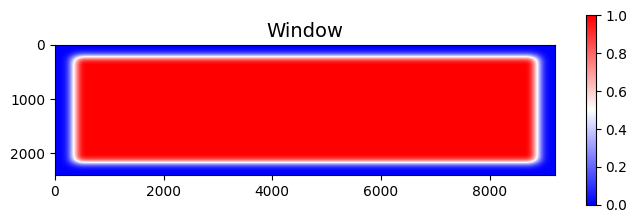

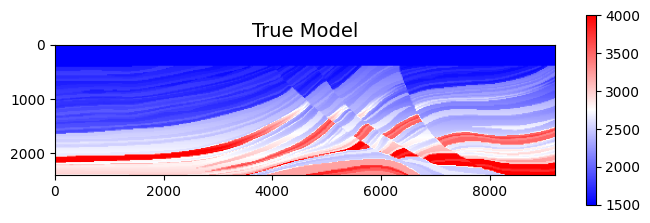

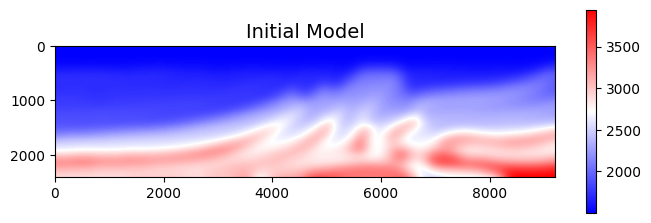

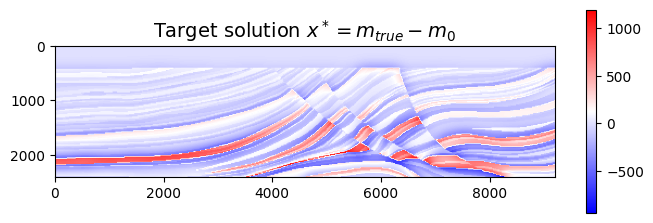

In [3]:
sip.plot_pictures()

## Hessian approximations

### The PSF Method

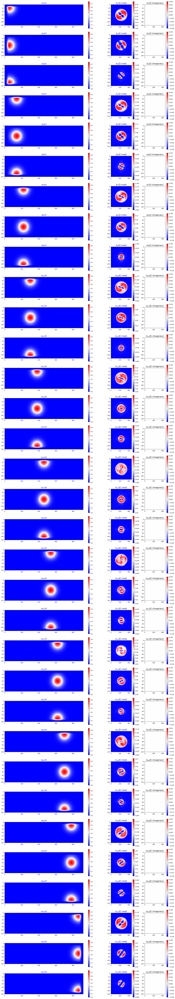

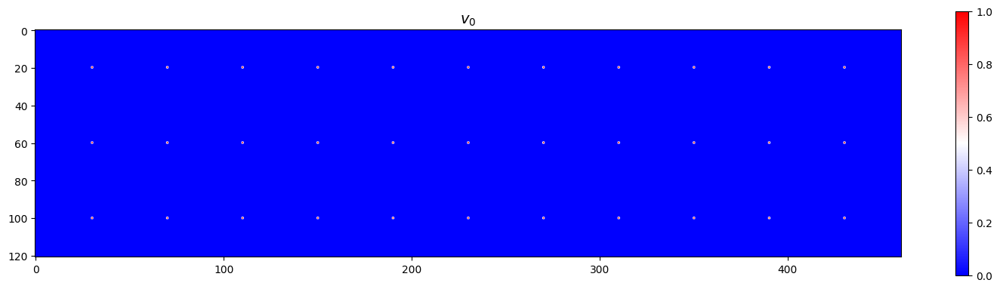

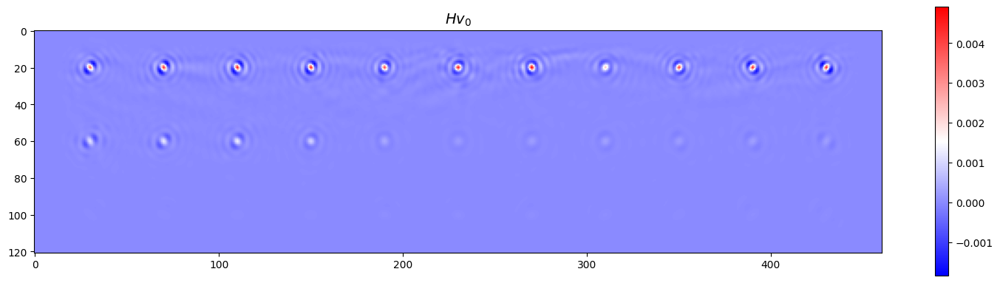

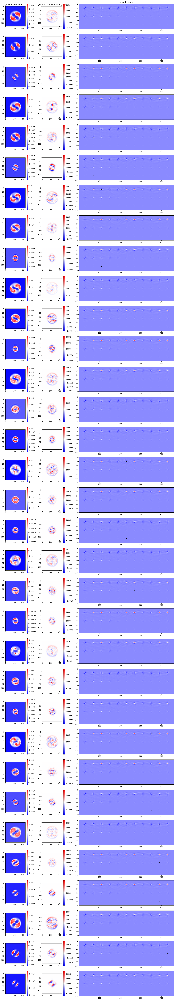

In [4]:
from lrs_psido.approximators import PsfApproximator

psf_settings = {
    "filter_sigma": 4.0,
    "matvec_plan": [
        {
            "sampling": {
                "method": "equispace",
                "steps": [40, 40],
                "anchor": [30, 20],
                "constraint": {"x": [30, 430], "y": [20, 100]},
                "smoothness": 0.4,
            }
        }
    ],
    "smooth": False,
    "real_only": True,
    "sqrt": True,
}
psf_approximator = PsfApproximator(
    sip.n, log_dir=EXP_PATH / "psf", window=sip.window, show_proc=True, **psf_settings
)
psf_sqrtH = psf_approximator.approximate_sqrt(H)

### The PDO Method

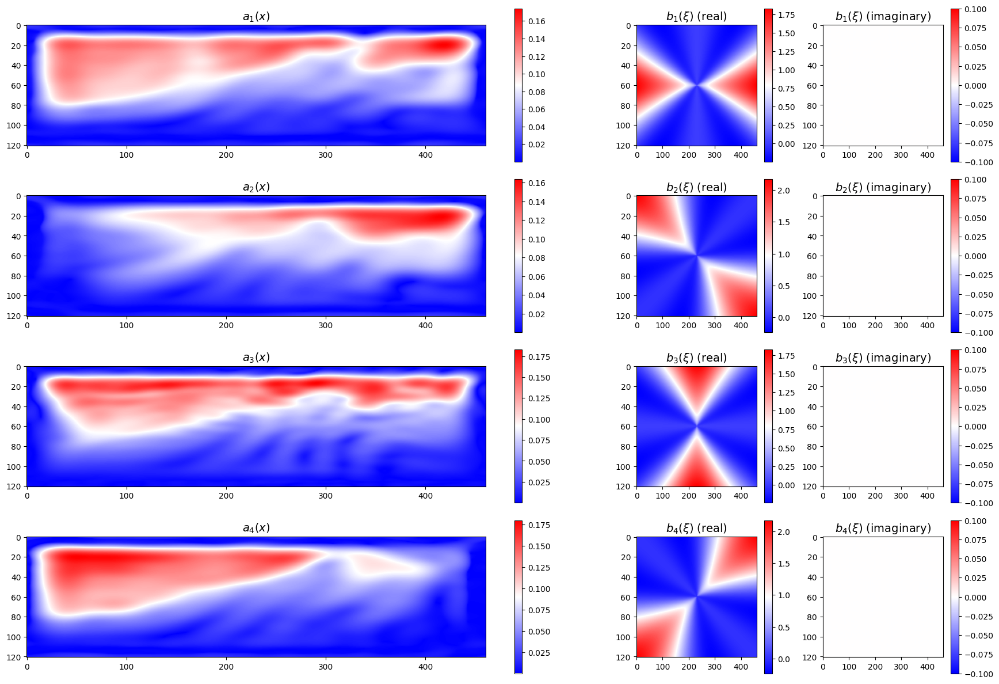

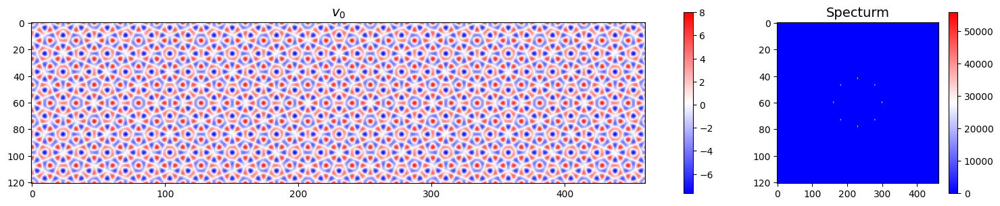

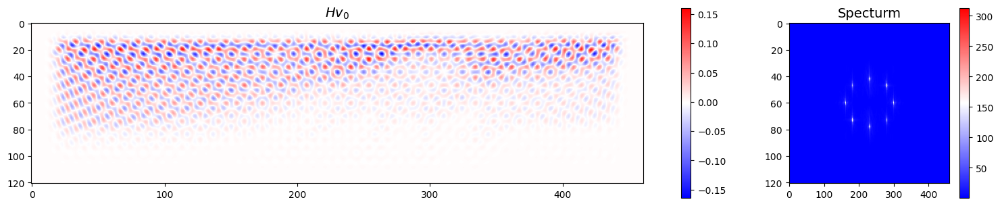

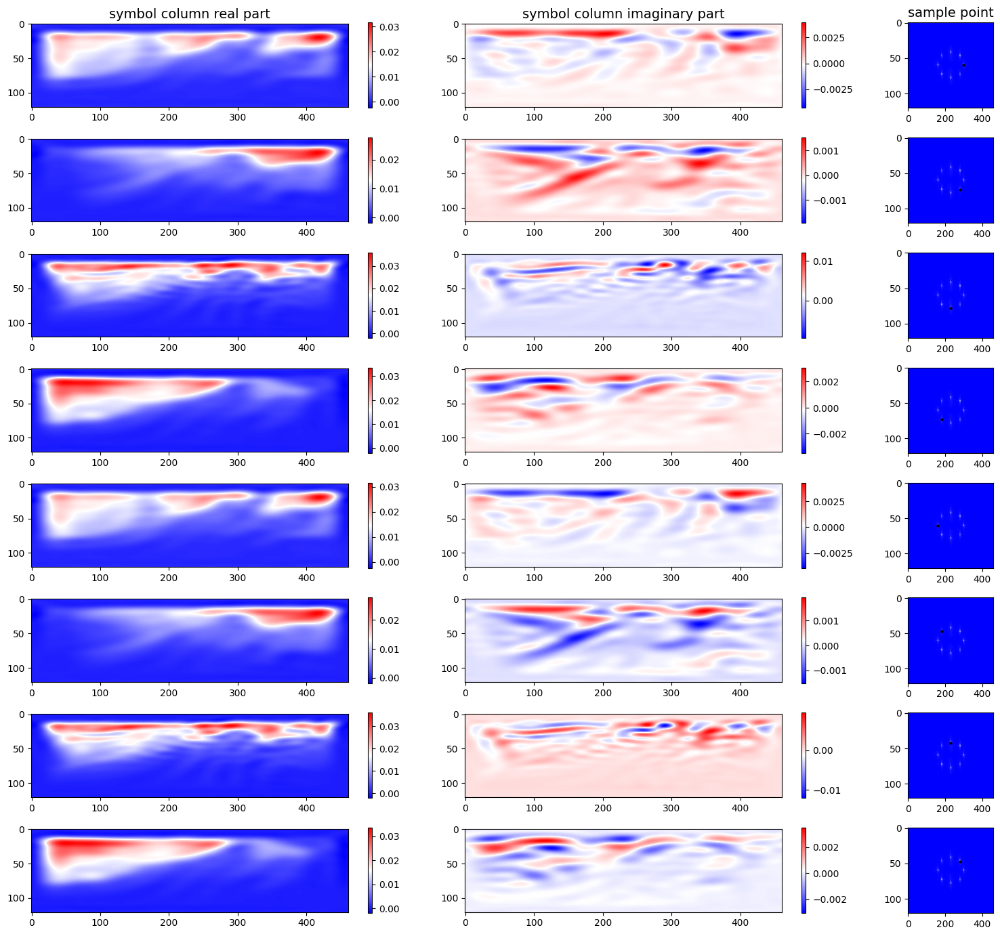

In [5]:
from lrs_psido.approximators import PdoApproximator

pdo_settings = {
    "filter_sigma": 4.0,
    "matvec_plan": [
        {
            "sampling": {"method": "circle", "l2_ratio": 0.3, "num_angles": 8},
            "spliting": {
                "method": "ellipse",
                "sigmas": [
                    [12, 12],
                    [12, 12],
                    [18, 18],
                    [12, 12],
                    [12, 12],
                    [12, 12],
                    [18, 18],
                    [12, 12],
                ],
                "smoothness": 0.4,
            },
        }
    ],
    "sqrt": True,
    "real_only": True,
    "smooth": True,
}
pdo_approximator = PdoApproximator(
    sip.n, log_dir=EXP_PATH / "pdo", show_proc=True, **pdo_settings
)
pdo_sqrtH = pdo_approximator.approximate_sqrt(H)

### The PSF+ Method

rows.shape = (33, 461, 121)
cols.shape = (8, 461, 121)
alpha = 0.0006000257298419516
Saving computed symbol


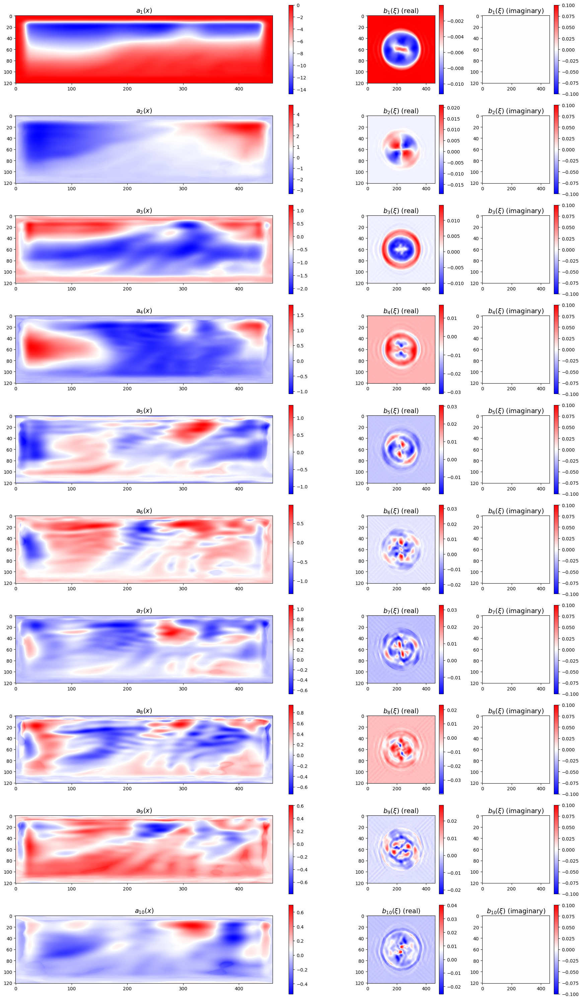

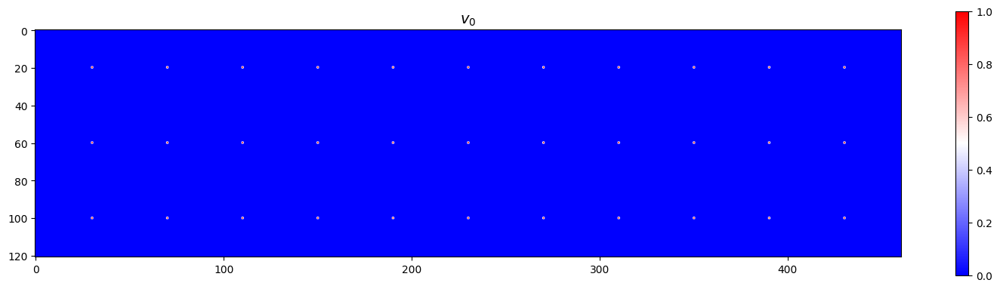

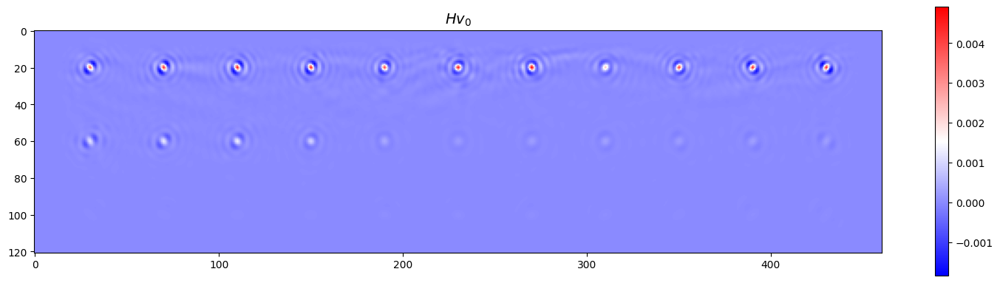

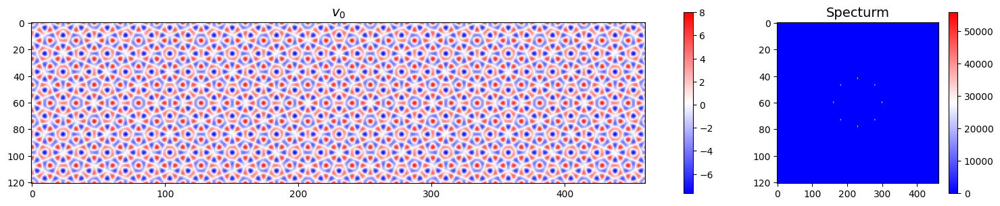

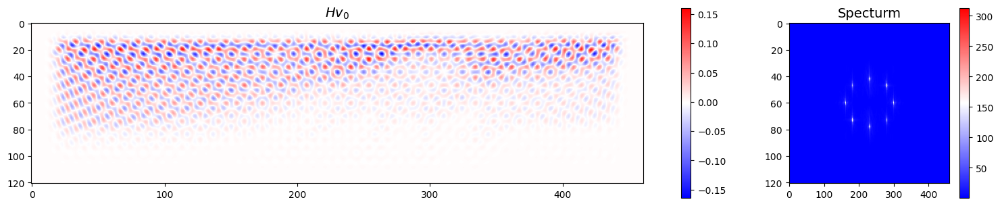

In [6]:
from lrs_psido.approximators import PsfPlusApproximator

psfp_settings = {
    "filter_sigma": 4.0,
    "matvec_plan_rows": [
        {
            "sampling": {
                "method": "equispace",
                "steps": [40, 40],
                "anchor": [30, 20],
                "constraint": {"x": [30, 430], "y": [20, 100]},
                "smoothness": 0.4,
            }
        }
    ],
    "matvec_plan_cols": [
        {
            "sampling": {"method": "circle", "l2_ratio": 0.3, "num_angles": 8},
            "spliting": {
                "method": "ellipse",
                "sigmas": [
                    [12, 12],
                    [12, 12],
                    [18, 18],
                    [12, 12],
                    [12, 12],
                    [12, 12],
                    [18, 18],
                    [12, 12],
                ],
                "smoothness": 0.4,
            },
        }
    ],
    "smooth_rows": False,
    "smooth_cols": False,
    "real_only": True,
    "sqrt": True,
    "rescale": False,
    "symbol_rank": 10,
}
psfp_approximator = PsfPlusApproximator(
    sip.n,
    log_dir=EXP_PATH / "psfp",
    window=sip.window,
    show_proc=False,
    **psfp_settings
)
psfp_sqrtH = psfp_approximator.approximate_sqrt(H)

## Seismic Inversion: Preconditioned L-BFGS

In [7]:
import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import scipy.linalg as scila
import scipy.sparse.linalg as spla
from inversion.clean import clean_map
from inversion.plbfgs import plbfgs
from psido.linear_operators import RealPDOLowRankSymbol
from utils.fwi_results_analyzer import FWIResultsAnalyzer, get_optim_result
from typing import Sequence
from scipy import ndimage


def get_low_freq_pdo(n: Sequence[int], sigma: float) -> RealPDOLowRankSymbol:
    pdo_c = np.asarray([np.ones(n)])
    pdo_r = np.asarray([ndimage.fourier_gaussian(np.ones(n), sigma=sigma)])
    A = RealPDOLowRankSymbol(pdo_c, pdo_r)
    return A


def run_lbfgs(
    sip: SeismicInverseProblem,
    preconditioning: str,
    sqrtH: spla.LinearOperator,
    low_freq_weight: float,
    low_freq_sigma: float,
    out_path: Path,
) -> None:
    out_path.mkdir(parents=True, exist_ok=True)

    x0 = np.zeros_like(sip.mt)
    if preconditioning is None:  # No preconditioner
        res = plbfgs(
            sip.total_cost,
            sip.total_grad,
            x0,
            max_vector_pairs_stored=100,
            rtol=1e-6,
            stag_tol=1e-12,
            max_iter=500,
            checkpoint_dir=str(out_path),
        )
    elif preconditioning == "prior":  # Prior preconditioner
        res = plbfgs(
            sip.total_cost,
            sip.total_grad,
            x0,
            max_vector_pairs_stored=100,
            rtol=1e-6,
            stag_tol=1e-12,
            max_iter=500,
            checkpoint_dir=str(out_path),
            inv_hess0=sip.Rinv,
            hess0=sip.R,
            lbfgs_inv_hess_kwargs={"gamma_type": 1},
        )
    else:  # Our proposed form of preconditioner
        if low_freq_weight != 0:
            sqrtH = sqrtH + low_freq_weight * get_low_freq_pdo(sip.n, low_freq_sigma)
        Hhat = sqrtH @ sqrtH.H
        Pinv = Hhat + sip.R
        precond_func = lambda x: spla.cg(Pinv, x, rtol=1e-15)[0]
        P = spla.LinearOperator(sip.R.shape, matvec=precond_func)

        res = plbfgs(
            sip.total_cost,
            sip.total_grad,
            x0,
            max_vector_pairs_stored=100,
            rtol=1e-6,
            stag_tol=1e-12,
            max_iter=500,
            checkpoint_dir=str(out_path),
            inv_hess0=P,
            hess0=Pinv,
            lbfgs_inv_hess_kwargs={"gamma_type": 1},
        )

    # Save solution
    xf, info, _ = res
    np.save(out_path / "xf", xf)
    with open(out_path / "info.json", "w") as file:
        json.dump(info, file)

    plt.figure(figsize=sip.x_size)
    sip.plot(sip.m0 + sip.W * xf)
    plt.colorbar()
    plt.title("MAP point")
    plt.savefig(out_path / "mf.png")

    clean_map(out_path)

### No Preconditioner

In [8]:
# Take hours
# run_lbfgs(sip, None, None, None, None, EXP_PATH / "no_precond/lbfgs")

### Prior Preconditioner

In [9]:
# Take hours
# run_lbfgs(sip, "prior", None, None, None, EXP_PATH / "prior_precond/lbfgs")

### PSF Preconditioner

In [10]:
# Take hours
# run_lbfgs(sip, "psf", psf_sqrtH, 0.1, 4.0, EXP_PATH / "psf/lbfgs")

### PDO Preconditioner

In [11]:
# Take hours
# run_lbfgs(sip, "pdo", pdo_sqrtH, 0.1, 4.0, EXP_PATH / "pdo/lbfgs")

### PSF+ Preconditioner

In [12]:
# Take hours
# run_lbfgs(sip, "psfp", psfp_sqrtH, 0.1, 4.0, EXP_PATH / "psfp/lbfgs")

### Summary

In [13]:
labels = [
    "No Precond",
    "Prior Precond",
    "PSF Precond",
    "PDO Precond",
    "PSF+ Precond",
]
paths = [
    EXP_PATH / "no_precond/lbfgs",
    EXP_PATH / "prior_precond/lbfgs",
    EXP_PATH / "psf/lbfgs",
    EXP_PATH / "pdo/lbfgs",
    EXP_PATH / "psfp/lbfgs",
]
results = [get_optim_result(p, label) for p, label in zip(paths, labels)]
analyzer = FWIResultsAnalyzer(sip, results, output_dir=EXP_PATH / "lbfgs")

In [14]:
for res in results:
    print(f"{res.label}: {res.xx.shape[0]-1}")

No Precond: 326
Prior Precond: 410
PSF Precond: 202
PDO Precond: 179
PSF+ Precond: 194


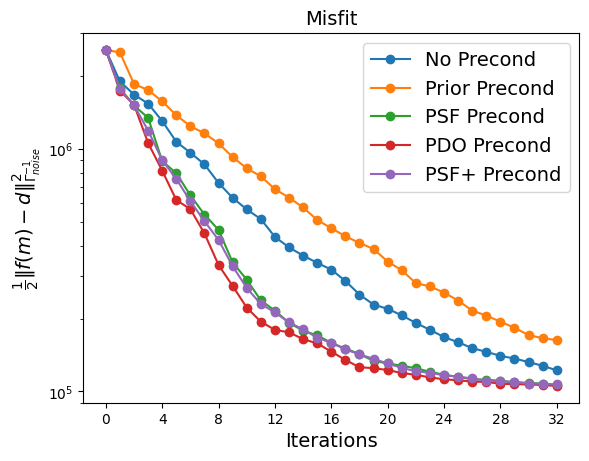

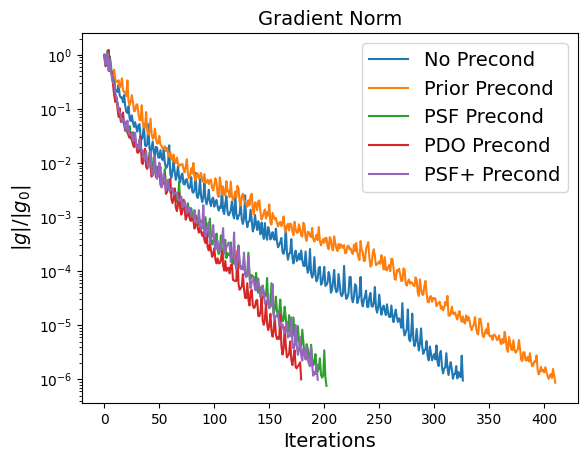

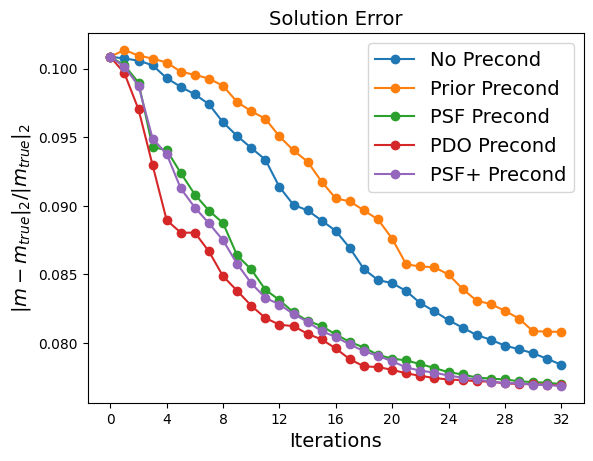

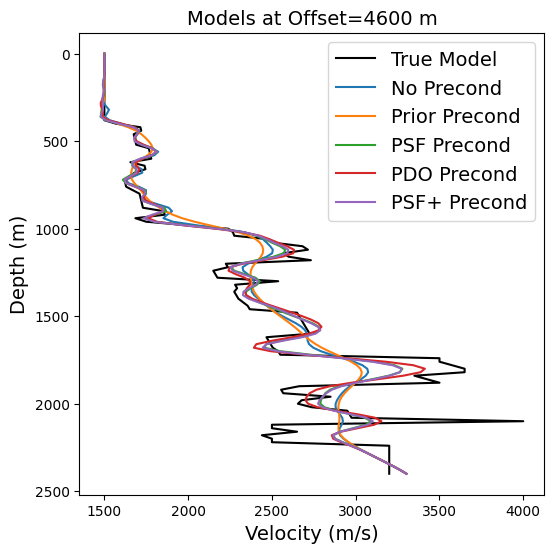

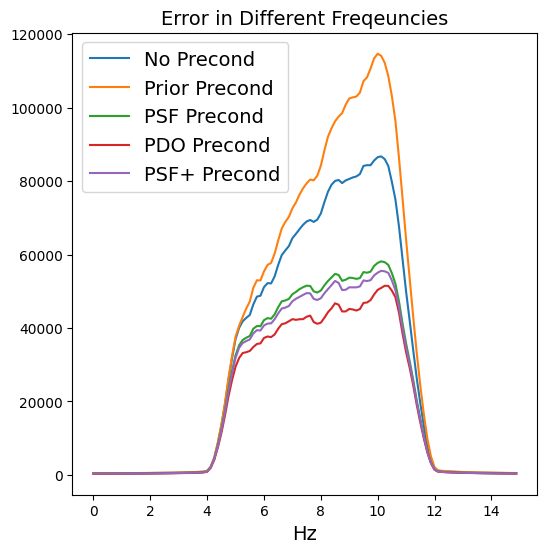

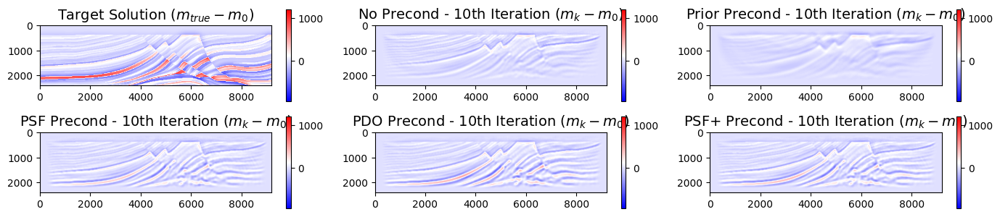

In [15]:
analyzer.plot_all(maxiter=32, show_iter=10)